I made lists of barcodes using the extractBCs method in another python notebook in this folder

Here I'm reloading the lists and generating a list of counts for each unique barcode in a single dataframe

I'm including the PacBio data, both raw and filtered



Still need:

Use Bokeh for all graphs

Add unit test

- does counting lines in the df count as a unit test?

Subsample for coefficient of variation to see if it changes

Timepoint analysis

Color differently

- WT and K191A special colors
- Color points by how many reads there were
- Or by coefficient of variation

Also plot

- Averages of barcodes of a given mutant
    - get aggregate value and plot
    - use error between barcodes

Add labels

- To outliers
- To references

Heatmap

- number of barcodes
- error

Add histograms to sides of scatter plots

Add line-plot on top of heatmap that shows average enrichment at each position

Bayesian analysis (with help from David)
    Briefly: assume poisson distribution of barcodes, gaussian distribution among barcodes of a given mutant, see what happens


In [1]:
import numpy as np
import itertools
import math
import pandas as pd
import time
import Bio
from Bio import SeqIO
from Bio.Seq import Seq
import matplotlib
import matplotlib.pyplot as plt
from ast import literal_eval
import csv
import venn
from numpy import cov
from scipy.stats import spearmanr, pearsonr
from numpy import cov
from scipy.stats import spearmanr

experimentName = 'NP_11_27_selection_first'
listOfFileNames = ['NP_11_27_23', 'NP_11_27_24', 'NP_11_27_25']


In [2]:
# Running this cell will stop the jupyter notebook from opening a new tab if that starts happening

import bokeh.io
from bokeh.layouts import gridplot
from bokeh.io import show, export_svgs, export_png
from bokeh.transform import transform
from bokeh.plotting import ColumnDataSource, output_file, figure, show, save, output_notebook, reset_output
from bokeh.models import BasicTicker, ColorBar, ColumnDataSource, LinearColorMapper, LogColorMapper, PrintfTickFormatter, Whisker, Title, NumeralTickFormatter, Label, LabelSet, Text, HoverTool
reset_output()
output_notebook()

Loading BokehJS ...

In [3]:
combinedDF = pd.read_csv(experimentName + '.csv')


/Users/noamprywes/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2728: DtypeWarning: Columns (2,7,8,9,10,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
# Histogram of coefficient of variation data





coeffVarDataDF = combinedDF.dropna(subset = ['Coefficient_of_variation'])['Coefficient_of_variation'].unique()

def make_plot(title, hist, edges, bins):
    TOOLS="crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save,hover"
    
    source = ColumnDataSource(data=dict(   
    top=hist, 
    bottom=[0]*bins[1:], 
    left=edges[:-1],
    right=edges[1:]
    ))


    
    TOOLTIPS = [
        ("Bin contents", "@top"),
        ('Edges', "@left to @right")
    ]
    


    p = figure(title=title, 
               tools=TOOLS, 
#                tooltips = TOOLTIPS, 
               background_fill_color=None)
    
    p.quad(source = source, top="top", bottom="bottom", left="left", right="right",
       fill_color="black", line_color="white", alpha=0.5)

    p.y_range.start = 0
    p.xaxis.axis_label = 'Coefficient of variation'
    p.yaxis.axis_label = 'Barcodes with that coefficient of variation'
    p.grid.grid_line_color="white"
    
    p.toolbar.logo = None
    
    # To get hover to work on iMac
    hover = HoverTool()
    hover.tooltips = TOOLTIPS
    p.tools.append(hover)

    return p

bins = np.arange(0, 10, 0.1)
hist, edges = np.histogram(coeffVarDataDF, density=False, bins=bins, range = (0,10))

p1 = make_plot("Coefficient of variation distribution", hist, edges, bins)

label1 = Label(
                x=3.5, 
                y=50, 
                x_units='data', 
                y_units='data',
                text='Total mutants in sample: {}'.format(str(len(coeffVarDataDF))),
                text_font_size = '13px'
                )

label2 = Label(
                x=3.5, 
                y=45, 
                x_units='data', 
                y_units='data',
                text='Mutants with coefficient of variation under 1: {}'
                        .format(str(len(coeffVarDataDF[coeffVarDataDF < 1]))),
                text_font_size = '13px'
                )
                

p1.add_layout(label1)
p1.add_layout(label2)

p1.outline_line_color = None



# show(p1, ncols=1, plot_width=400, plot_height=400, toolbar_location=None)
show(p1)



In [5]:
# Generate data for barcode histograms

histData102 = []
histData103 = []
histData107 = []

for i, experiment in enumerate(listOfFileNames):
    data = np.histogram(combinedDF[str(listOfFileNames[i])], bins = range(0,100,1))
    histData102.append(data)
    data = np.histogram(combinedDF[str(listOfFileNames[i])], bins = range(0,1000,1))
    histData103.append(data)
    data = np.histogram(combinedDF[str(listOfFileNames[i])], bins = range(0,10000000,100000))
    histData107.append(data)


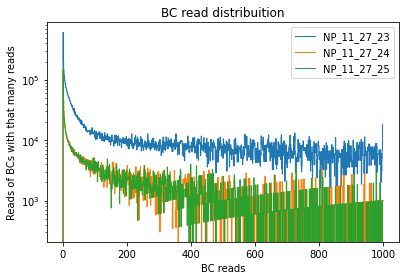

In [6]:
# This is a graph where I multiply by the number of barcodes again 
# The y-axis reads "reads of BCs with that many reads"
# I multiply each bin by its x-axis value
# I had to move the values over by one to handle indexes and I had to trim a value from the x-axis values
# Ideally, the total # of reads divided by the maximum of this curve will be the library complexity

for i, experiment in enumerate(listOfFileNames):
    xVals = histData103[0][1][1:]
    yVals = histData103[i][0]
    corrYVals = []
    for j, count in enumerate(yVals):
        corrYVals.append(count * (xVals[j] - 1))
    plt.step(xVals, corrYVals, label = listOfFileNames[i], linewidth = 1)
    
plt.title('BC read distribuition')
plt.ylabel('Reads of BCs with that many reads')
plt.xlabel('BC reads')
plt.tight_layout()
plt.rcParams["figure.figsize"] = (15,4)
plt.yscale("log")
plt.legend()

plt.savefig('NP_11_27_barcodesHist_selection.pdf')


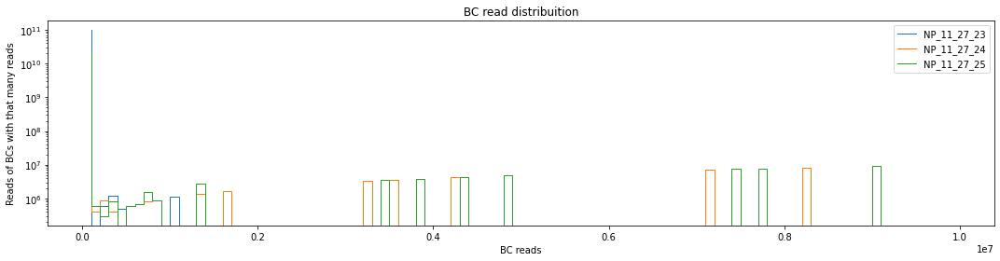

In [7]:
# Histogram out to many more reads

for i, experiment in enumerate(listOfFileNames):
    xVals = histData107[0][1][1:]
    yVals = histData107[i][0]
    corrYVals = []
    for j, count in enumerate(yVals):
        corrYVals.append(count * (xVals[j] - 1))
    plt.step(xVals, corrYVals, label = listOfFileNames[i], linewidth = 1)

plt.rcParams["figure.figsize"] = (15,4)
plt.yscale("log")
plt.title('BC read distribuition')
plt.ylabel('Reads of BCs with that many reads')
plt.xlabel('BC reads')
plt.yscale('log')
plt.tight_layout()
plt.legend()

plt.savefig('NP_11_27_barcodesHist_selection_107.pdf')

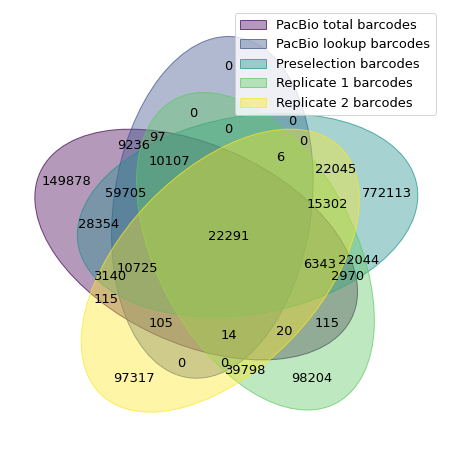

In [8]:
# lookup table (PacBio)
# Pre selection
# Rep1 and Rep2
# All PacBio barcodes, including those that didn't pass filters
# Use dropna() to pick barcodes that existed in each individual dataset

lookupBCs = set(combinedDF.dropna(subset=['correctedAAmut'])['Barcode'])
preselectionBCs = set(combinedDF.dropna(subset=['NP_11_27_23'])['Barcode'])
rep1BCs = set(combinedDF.dropna(subset=['NP_11_27_24'])['Barcode'])
rep2BCs = set(combinedDF.dropna(subset=['NP_11_27_25'])['Barcode'])
PacBioTotalBCs = set(combinedDF.dropna(subset=['Raw_PacBio_counts'])['Barcode'])

# Make venn diagram including unfiltered PacBio barcodes

from venn import venn
%matplotlib inline

BCData = {
    "PacBio total barcodes": PacBioTotalBCs, \
    "PacBio lookup barcodes": lookupBCs, \
    "Preselection barcodes": preselectionBCs, \
    "Replicate 1 barcodes": rep1BCs, \
    "Replicate 2 barcodes": rep2BCs
}

venn(BCData)

plt.savefig('NP-11-27-selection_venn.pdf')



In [9]:
# Get the PacBio and preselection datasets and drop NaNs to allow scipy to work
pacBioVsPreSelDF = combinedDF.dropna(subset=['Raw_PacBio_counts', 'NP_11_27_23'])
PacBioBCReadCounts = pacBioVsPreSelDF['Raw_PacBio_counts']
preSelectionBCReadCounts = pacBioVsPreSelDF['NP_11_27_23']
mutantTags =  pacBioVsPreSelDF['correctedAAmut']
preCounts = pacBioVsPreSelDF['NP_11_27_23']
postCounts1 = pacBioVsPreSelDF['NP_11_27_24']
postCounts2 = pacBioVsPreSelDF['NP_11_27_25']
barcode = pacBioVsPreSelDF['Barcode']

# Perform Spearman correlation analysis
(corr, pvalue) = spearmanr(PacBioBCReadCounts, preSelectionBCReadCounts)

source = ColumnDataSource(data=dict(
    x = PacBioBCReadCounts,
    y = preSelectionBCReadCounts,
    muts = mutantTags,
    preCounts = preCounts,
    postCounts1 = postCounts1,
    postcounts2 = postCounts2,
    barcode = barcode
))

TOOLS="crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save"


TOOLTIPS = [
#     ("index", "$index"),
#     ("(x,y)", "($x, $y)"),
    ("Mutant", "@muts"),
    ('PacBio abundance', '@x'),
    ("Preselection counts", '@preCounts'),
    ("Selection 1 counts", '@postCounts1'),
    ("Selection 2 counts", '@postcounts2'),
    ('Barcode', '@barcode')
]

p = figure(
           tools = TOOLS, \
#            tooltips=TOOLTIPS, \
           sizing_mode="scale_width", \
           plot_height=350, \
           x_axis_type="log", \
           y_axis_type="log", \
           title="PacBio vs. Preselection barcode abundances", \
           x_axis_label="PacBio barcode reads", \
           y_axis_label="Pre-selection barcode reads (NP-1-27-23)", \
           toolbar_location="below"
)

p.add_layout(Title(text='Spearmans correlation:\n %.3f' % corr, align="right"), "above")
        
p.circle('x', 'y', size=4, source=source, color = 'black')

# tooltips doesn't work on the iMac for some reason so this little hack gets around it
# Works for desktop and laptop
hover = HoverTool()
hover.tooltips = TOOLTIPS
p.tools.append(hover)

show(p)

p.output_backend = "svg"
# export_svgs(p, filename="bokehPacBioScatter.svg")
# export_png(p, filename="bokehPacBioScatter.png")


In [10]:
# Get the replicate datasets and drop NaNs to allow scipy to work
repComparison = combinedDF.dropna(subset=['WT_norm_enrich_avg'])
rep1 = repComparison['WT_norm_enrich_rep1']
rep2 = repComparison['WT_norm_enrich_rep2']
pacBio =  repComparison['Raw_PacBio_counts']
mutantTags =  repComparison['correctedAAmut']
preCounts = repComparison['NP_11_27_23']
postCounts1 = repComparison['NP_11_27_24']
postCounts2 = repComparison['NP_11_27_25']
barcode = repComparison['Barcode']
citation = repComparison['citation']

# Perform Spearman correlation analysis
(corr, pvalue) = spearmanr(rep1, rep2)

source = ColumnDataSource(data=dict(
    x = rep1,
    y = rep2,
    muts = mutantTags,
    pacBio = pacBio,
    preCounts = preCounts,
    postCounts1 = postCounts1,
    postcounts2 = postCounts2,
    barcode = barcode,
    citation = citation
))

TOOLS="lasso_select,crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save"


TOOLTIPS = [
#     ("index", "$index"),
#     ("(x,y)", "($x, $y)"),
    ("Mutant", "@muts"),
    ('PacBio abundance', '@pacBio'),
    ("Preselection counts", '@preCounts'),
    ("Selection 1 counts", '@postCounts1'),
    ("Selection 2 counts", '@postcounts2'),
    ('Barcode', '@barcode'),
    ('Citation', '@citation')
]

p = figure(
           tools = TOOLS, \
#            tooltips=TOOLTIPS, \
           sizing_mode="scale_width", \
           plot_height=350, \
           x_axis_type="log", \
           y_axis_type="log", \
           title="Replicate comparison (WT normalized)", \
           x_axis_label="Replicate 1 (NP-11-27-24)", \
           y_axis_label="Replicate 2 (NP-11-27-25)", \
           toolbar_location="below"
)


# Try adding labels to a few outliers, WT, etc.

# labels = LabelSet(x='weight', y='height', text='names',
#               x_offset=5, y_offset=5, source=source, render_mode='canvas')

# citation = Label(x=70, y=70, x_units='screen', y_units='screen',
#                  text='Collected by Luke C. 2016-04-01', render_mode='css',
#                  border_line_color='black', border_line_alpha=1.0,
#                  background_fill_color='white', background_fill_alpha=1.0)

# p.add_layout(labels)
# p.add_layout(citation)


p.add_layout(Title(text='Spearmans correlation:\n %.3f' % corr, align="right"), "above")
        
p.circle('x', 'y', size=4, source=source, color = 'black')

# tooltips doesn't work on the iMac for some reason so this little hack gets around it
# Works for desktop and laptop
hover = HoverTool()
hover.tooltips = TOOLTIPS
p.tools.append(hover)

show(p)

# p.output_backend = "svg"
# export_svgs(p, filename="bokehPacBioScatter.svg")
# export_png(p, filename="bokehPacBioScatter.png")

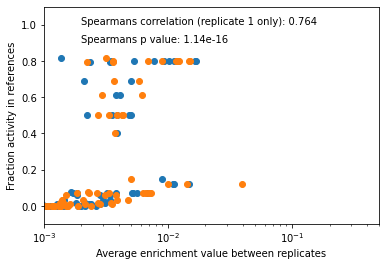

In [11]:
# Correlation between each replicate and the literature
# Separate for each replicate

biochemRepComparison = combinedDF.dropna(subset=['WT_norm_enrich_rep1', 'WT_norm_enrich_rep2', 'vcMUT/vcWT', 'correctedAAmut'])

from numpy import cov
from scipy.stats import spearmanr

rep1Enrichment = biochemRepComparison['WT_norm_enrich_rep1']
rep2Enrichment = biochemRepComparison['WT_norm_enrich_rep2']

biochemData = biochemRepComparison['vcMUT/vcWT']
mutantTags = biochemRepComparison['correctedAAmut']

(corr, pvalue) = spearmanr(rep1Enrichment, biochemData)

plt.scatter(rep1Enrichment, biochemData)
plt.scatter(rep2Enrichment, biochemData)

plt.xlabel('Average enrichment value between replicates')
plt.ylabel('Fraction activity in references')
plt.xscale('log')
# plt.yscale('log')

plt.xlim(0.001,0.5)
plt.ylim(-0.1,1.1)

plt.text(0.002, 1, 'Spearmans correlation (replicate 1 only): %.3f' % corr)
plt.text(0.002, 0.9, 'Spearmans p value: %.2e' % pvalue)

plt.savefig('NP-11-27_comparisonToRrMuts041221.pdf')


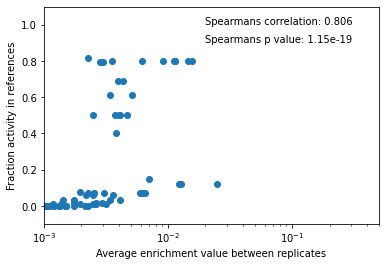

In [12]:
# Correlation between each barcode and the literature
# Separate for each barcode

biochemAvgComparison = combinedDF.dropna(subset=['WT_norm_enrich_avg', 'vcMUT/vcWT', 'correctedAAmut'])

from numpy import cov
from scipy.stats import spearmanr

repAvgEnrichments = biochemAvgComparison['WT_norm_enrich_avg']
biochemData = biochemAvgComparison['vcMUT/vcWT']
mutantTags = biochemAvgComparison['correctedAAmut']

(corr, pvalue) = spearmanr(repAvgEnrichments, biochemData)

plt.scatter(repAvgEnrichments, biochemData)
plt.xlabel('Average enrichment value between replicates')
plt.ylabel('Fraction activity in references')
plt.xscale('log')
# plt.yscale('log')

plt.xlim(0.001,0.5)
plt.ylim(-0.1,1.1)

plt.text(0.02, 1, 'Spearmans correlation: %.3f' % corr)
plt.text(0.02, 0.9, 'Spearmans p value: %.2e' % pvalue)

plt.savefig('NP-11-27_comparisonToRrMutsRepAvg041221.pdf')



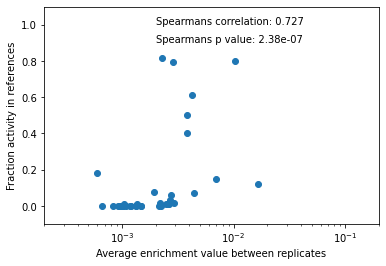

In [13]:
# Correlation between each muant and the literature averaged across barcodes

biochemBCAvgComparison = combinedDF.dropna(subset=['mut_BCs_mean', 
                                                   'vcMUT/vcWT', 
                                                   'correctedAAmut']).drop_duplicates(subset = ['correctedAAmut'])

BCAvgEnrichments = biochemBCAvgComparison['mut_BCs_mean']
biochemData = biochemBCAvgComparison['vcMUT/vcWT']
mutantTags = biochemBCAvgComparison['correctedAAmut']

(corr, pvalue) = spearmanr(BCAvgEnrichments, biochemData)

plt.scatter(BCAvgEnrichments, biochemData)
plt.xlabel('Average enrichment value between replicates')
plt.ylabel('Fraction activity in references')
plt.xscale('log')
# plt.yscale('log')

plt.xlim(0.0002,0.2)
plt.ylim(-0.1,1.1)

plt.text(0.002, 1, 'Spearmans correlation: %.3f' % corr)
plt.text(0.002, 0.9, 'Spearmans p value: %.2e' % pvalue)

plt.savefig('NP-11-27_comparisonToRrMutsBCavgs041221.pdf')

In [14]:
# Use bokeh to make interactive scatter plot
# Average across replicates and barcodes

biochemBCAvgComparison = combinedDF.dropna(subset=['mut_BCs_mean', 
                                                   'vcMUT/vcWT', 
                                                   'correctedAAmut']).drop_duplicates(subset = ['correctedAAmut'])

BCAvgEnrichments = biochemBCAvgComparison['mut_BCs_mean']
biochemData = biochemBCAvgComparison['vcMUT/vcWT']
mutantTags = biochemBCAvgComparison['Mutation']
preCounts = biochemBCAvgComparison['NP_11_27_23']
postCounts1 = biochemBCAvgComparison['NP_11_27_24']
postCounts2 = biochemBCAvgComparison['NP_11_27_25']
biochemError = biochemBCAvgComparison['Error (fraction of fraction)']
biochemSelectivity = biochemBCAvgComparison['Sc/o']
biochemCitation = biochemBCAvgComparison['citation']
sigmas = biochemBCAvgComparison['mut_BCs_stdDev']
coeVar = biochemBCAvgComparison['Coefficient_of_variation']
BCsForMut = biochemBCAvgComparison['Number_of_BCs_for_mut']

source = ColumnDataSource(data=dict(
    x=BCAvgEnrichments,
    y=biochemData,
    muts=mutantTags,
    preCounts = preCounts,
    postCounts1 = postCounts1,
    postcounts2 = postCounts2,
    biochemError = biochemError,
    biochemSelectivity = biochemSelectivity,
    biochemCitation = biochemCitation,
    coeVar = coeVar,
    sigmas = sigmas,
    BCsForMut = BCsForMut
))

TOOLS="crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save"


TOOLTIPS = [
#     ("index", "$index"),
#     ("(x,y)", "($x, $y)"),
    ("Mutant", "@muts"),
#     ("Preselection counts", '@preCounts'),
#     ("Selection 1 counts", '@postCounts1'),
#     ("Selection 2 counts", '@postcounts2'),
    ('Average enrichment across barcodes', '@x'),
    ('% WT activity', '@y'),
#     ('Error (fraction of %WT activity)', '@biochemError'),
    ('Sc/o', '@biochemSelectivity'),
    ('Citation', '@biochemCitation'),
#     ('Coefficient of variation', '@coeVar'),
#     ('Sigmas', '@sigmas'),
    ('Barcodes for that mutation', '@BCsForMut')
]

p = figure(
           tools = TOOLS, \
#            tooltips=TOOLTIPS, 
           sizing_mode="scale_width", 
           plot_height=350, 
           x_axis_type="log", 
           title="Comparison to biochemistry", 
           x_axis_label="Average enrichment", 
           y_axis_label="Percent WT activity in literature", 
           toolbar_location="below"
)

p.yaxis[0].formatter = NumeralTickFormatter(format="0%")

p.circle('x', 'y', size=4, source=source, color = 'black')

# Add error values, standard deviation in x axis
basex = list(biochemData)
negXError = list((BCAvgEnrichments - (sigmas * 1)))
posXError = list((BCAvgEnrichments + (sigmas * 1)))

source_error_x = ColumnDataSource(data=dict(base=basex, 
                                            lower=negXError, 
                                            upper=posXError))
p.add_layout(
    Whisker(source=source_error_x, 
            base="base", 
            upper="upper", 
            lower="lower", 
            dimension = "width", 
            line_color = 'black')
)

# Add error values, fraction of WT activity in y axis
basey = list(BCAvgEnrichments)
negYError = list(biochemData - biochemError)
posYError = list(biochemData + biochemError)

source_error_y = ColumnDataSource(data=dict(base=basey, 
                                            lower=negYError, 
                                            upper=posYError))
p.add_layout(
    Whisker(source=source_error_y, 
            base="base", 
            upper="upper", 
            lower="lower", 
            dimension = "height")
)



# tooltips doesn't work on the iMac for some reason so this little hack gets around it
hover = HoverTool()
hover.tooltips = TOOLTIPS
p.tools.append(hover)


pvalstr = '{0:1.2e}'.format(pvalue)

label1 = Label(
                x=0.1, 
                y=0.4, 
                x_units='data', 
                y_units='data',
                text='Spearmans correlation: {}, p value: {}'.format(str(corr)[:4], pvalstr),
                text_font_size = '13px'
                )
                
p.add_layout(label1)


show(p)

# Figure out how to get consistent outputs

from bokeh.io import export_svgs
# p.output_backend = "svg"
# export_svgs(p, filename="bokehBiochem.svg")



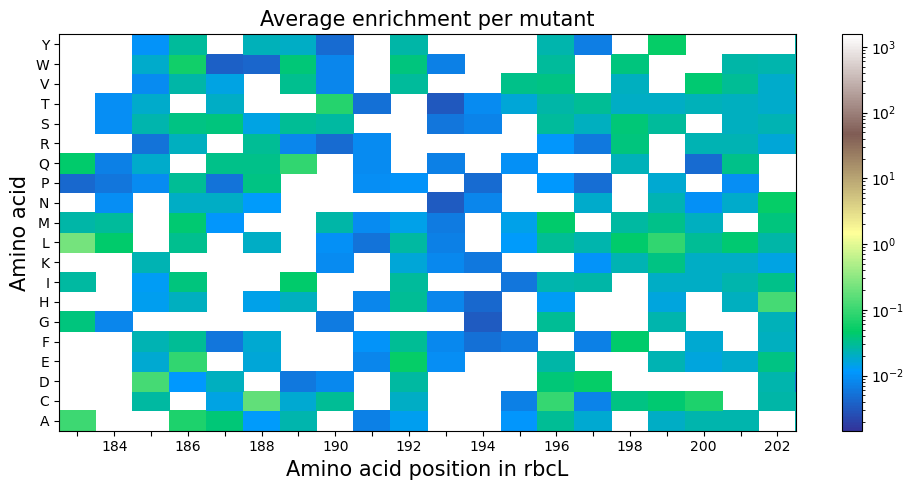

In [38]:
# Heatmap showing each individual mutation read frequency
# This will only give the barcode heatmap for now
# df.groupby('A')['B'].mean()
positionAAFreq = removeWT.groupby(['AAPosition', 'MutAA'])['avgEnrich'].mean()
dfPositionAAFreq = positionAAFreq.to_frame(name = 'avgEnrich')
pivotBCs = dfPositionAAFreq.pivot_table(index = 'MutAA', columns = 'AAPosition', values = 'avgEnrich')

# Convert pivot table to regular dataframe
pivotBCsReg = pd.DataFrame(pivotBCs.to_records()).set_index('MutAA')

fig, (ax1) = plt.subplots(1, tight_layout=True, figsize=(10,5), dpi = 100)
pcmBCs = ax1.pcolor(pivotBCsReg, cmap = 'terrain', norm=matplotlib.colors.LogNorm())

ax1.set_title('Average enrichment per mutant', size = 15)
ax1.set_xlabel('Amino acid position in rbcL', size = 15)
ax1.set_ylabel('Amino acid', size = 15)
# This sets the ticks in the middle
ax1.set_yticks(np.arange(0.5, 20.5))
ax1.set_yticklabels(pivotBCs.index)


plt.xticks(np.arange(0.5, len(pivotBCsReg.columns), 1), pivotBCsReg.columns)
plt.xlim(180,200)

fig.colorbar(pcmBCs, ax = ax1)

# xAxisVals = pivotBCsReg.columns
# visibleTicks = [::20]


plt.setp(ax1.get_xticklabels()[::2], visible=False)


plt.savefig('NP-11-27-heatmap.pdf')

plt.show()

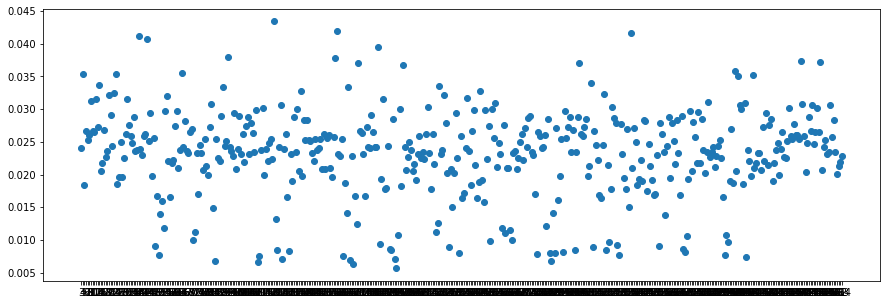

In [39]:
# Median enrichment value by position

plt.rcParams["figure.figsize"] = (15,5)

plt.scatter(pivotBCsReg.median().index, pivotBCsReg.median())

plt.savefig('NP-11-27-medianEnrichmentByPos.pdf')


In [40]:
from bokeh.layouts import row
from bokeh.plotting import figure, output_file, show

factors = ["a", "b", "c", "d", "e", "f", "g", "h"]
x =  [50, 40, 65, 10, 25, 37, 80, 60]

dot = figure(title="Categorical Dot Plot", tools="", toolbar_location=None,
            y_range=factors, x_range=[0,100])

dot.segment(0, factors, x, factors, line_width=2, line_color="green", )
dot.circle(x, factors, size=15, fill_color="orange", line_color="green", line_width=3, )

factors = ["foo 123", "bar:0.2", "baz-10"]
x = ["foo 123", "foo 123", "foo 123", "bar:0.2", "bar:0.2", "bar:0.2", "baz-10",  "baz-10",  "baz-10"]
y = ["foo 123", "bar:0.2", "baz-10",  "foo 123", "bar:0.2", "baz-10",  "foo 123", "bar:0.2", "baz-10"]
colors = [
    "#0B486B", "#79BD9A", "#CFF09E",
    "#79BD9A", "#0B486B", "#79BD9A",
    "#CFF09E", "#79BD9A", "#0B486B"
]

hm = figure(title="Categorical Heatmap", tools="hover", toolbar_location=None,
            x_range=factors, y_range=factors)

hm.rect(x, y, color=colors, width=1, height=1)


show(hm)  # open a browser

In [41]:
# Bokeh heatmap

df = pd.DataFrame(dfPositionAAFreq).reset_index()

df = df.astype({'AAPosition': 'str'})

source = ColumnDataSource(df)

colors = ["#75968f", "#a5bab7", "#c9d9d3", "#e2e2e2", "#dfccce", "#ddb7b1", "#cc7878", "#933b41", "#550b1d"]
colors = 'Inferno256'
mapper = LogColorMapper(palette=colors, low=df.avgEnrich.min(), high=df.avgEnrich.max())

TOOLTIPS = [
    ("Mutant", "@MutAA"),
    ("Position", '@AAPosition'),
    ("Average enrichment", '@avgEnrich'),
]

TOOLS="crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save"


p = figure(
#            sizing_mode="scale_width", \
           plot_width=1000, \
#            plot_height=300, \
           title="Average enrichment heatmap", \
           x_range = list(df['AAPosition'].unique()), \
           y_range=list(df['MutAA'].unique()), \
           toolbar_location='below', \
           tools = TOOLS, \
#            tooltips=TOOLTIPS, \
           x_axis_location="above")

p.rect(
       x="AAPosition", \
       y="MutAA", \
       width=1, \
       height=1, \
       source=source, \
       line_color=None, \
       fill_color=transform('avgEnrich', mapper))

color_bar = ColorBar(color_mapper=mapper,
                     ticker=BasicTicker(desired_num_ticks=len(colors)),
                     formatter=PrintfTickFormatter(format="%4.1e"))

p.add_layout(color_bar, 'left')

p.axis.axis_line_color = None
p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "7px"
p.axis.major_label_standoff = 0
p.xaxis.major_label_orientation = 1.0


hover.tooltips = TOOLTIPS
p.tools.append(hover)

show(p)

from bokeh.io import export_svgs
p.output_backend = "svg"
export_svgs(p, filename="bokehHeatmap.svg")


['bokehHeatmap.svg']